In [34]:
import os
from os.path import isfile, join
import sys

from tqdm.notebook import tqdm
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import keras
from keras.applications.resnet_v2 import ResNet101V2

import utility.recommendations_utility as ru

In [2]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:80% !important; }</style>"))

## Creating model

In [4]:
# creating model
model = ResNet101V2(weights='imagenet', include_top=True, input_shape=(224, 224, 3))
model.summary()

Model: "resnet101v2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                        

Getting image features from avg_pool layer. Shape is equal (2048,)

In [5]:
feature_extractor = ru.create_feature_extractor(model, 'avg_pool')

In [37]:
# path to images folder
path = 'C:/Users/Роман/OneDrive - ITMO UNIVERSITY/Рисунки/looks'
target_size = (224, 224, '3', 6)

In [38]:
# get features from images
image_features = ru.get_features(path, target_size, feature_extractor)

# flatten
image_features = np.array([np.array(image_features[i]).flatten() for i in range(len(image_features))])

In [36]:
image_features.shape

(34, 2048)

In [5]:
# array for items visualization
image_viz = ru.get_viz(path, target_size)

0it [00:00, ?it/s]

In [44]:
total_items = df.shape[0]
image_features = df['image_feature'].values
feedback = ru.get_feedback_path(path, total_items)

In [ ]:
df = pd.DataFrame(data={'image_id': pd.Series(np.arange(len(image_features))),
                        'look_id': pd.Series([i[0] for i in feedback]), 
                        'image_feature': pd.Series(image_features), 
                        'image_viz': pd.Series(image_viz)
                       }
                 )

In [8]:
df.head()

,image_id,look_id,image_feature,image_viz
0,0,0,"[0.14402035, 0.0, 0.06851762, 0.019945193, 0.0...","[[[255, 255, 255], [255, 255, 255], [255, 255,..."
1,1,0,"[0.25916654, 0.29851174, 0.0, 0.0227336, 0.007...","[[[223, 206, 176], [230, 213, 183], [227, 211,..."
2,2,0,"[0.0, 0.15874709, 0.0, 0.0, 0.27026594, 0.0, 0...","[[[204, 204, 204], [143, 143, 143], [136, 136,..."
3,3,0,"[0.0135558, 0.92195845, 0.0, 0.0, 0.018632961,...","[[[255, 255, 255], [255, 255, 255], [255, 255,..."
4,4,0,"[0.0, 0.88556725, 0.19156538, 0.0, 0.015560213...","[[[255, 255, 255], [255, 255, 255], [255, 255,..."


## T-SNE for features

In [9]:
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
import seaborn as sns

In [12]:
%%time
# TSNE
tsne = TSNE(n_components=2, n_jobs=-1)
tsne_result = tsne.fit_transform(list(df['image_feature']))

C:\Users\Роман\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\Роман\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Wall time: 5min 19s


In [39]:
# saving dataframe in feather format
df.drop(columns='image_viz').to_feather("df_tsne.feather")

In [17]:
tsne_result[:,0], tsne_result[:,1]

array([ 32.429176,  57.887222, -23.740055, ...,  60.954617,  -8.712836,
       -62.742317], dtype=float32)

In [18]:
# df['tsne_0'] = tsne_result[:,0]
# df['tsne_1'] = tsne_result[:,1]
# df['image_viz'] = image_viz
tsne_0, tsne_1 = tsne_result[:,0], tsne_result[:,1]
tsne_2dim = np.array([val for val in zip(tsne_0, tsne_1)])

Now let's cut unimportant images such as text, photos of people and etc.

In [19]:
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from sklearn.cluster import DBSCAN

In [23]:
dbscan = DBSCAN(eps=1.7, min_samples=11).fit(tsne_2dim) # fitting the model
labels = dbscan.labels_ # getting the labels
len(np.unique(labels))

94

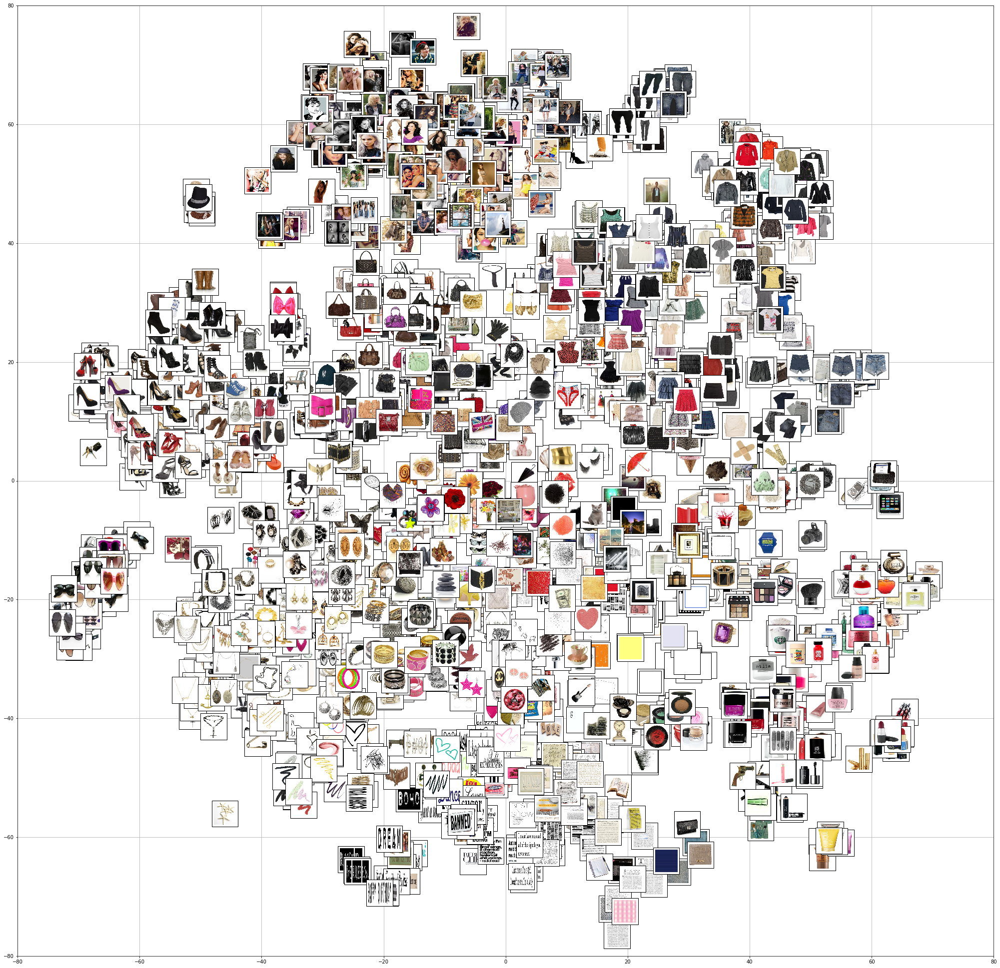

In [25]:
# Plot the clusters
xlim = (-80, 80)
ylim = (-80, 80)

fig, ax = plt.subplots(figsize=(35, 35))
ax.set_xlim(xlim)
ax.set_ylim(ylim)
for i in range(2000):
    imagebox = OffsetImage(image_viz[i], zoom=0.2)
    ab = AnnotationBbox(imagebox, (tsne_2dim[i, 0], tsne_2dim[i, 1]))
    ax.add_artist(ab)

plt.grid()
plt.draw()
plt.show()

In [24]:
import plotly.express as px
import plotly.io as io

fig = px.scatter(
    x=tsne_2dim[:, 0],
    y=tsne_2dim[:, 1],
    color=labels,
    template="plotly_white",
    color_continuous_scale=px.colors.sequential.Rainbow,
    width=1500, height=1300
    #text=words
)

fig.update_traces(textposition="top center")
fig.show()

In [27]:
bad_labels = [-1, 1, 87, 43, 20, 17, 23, 76, 75, 31, 32, 40, 8, 14, 9, 36, 25, 82, 91, 10, 91, 64, 77, 3, 27, 92, 57, 74, 61, 54, 39, 13, 59, 44, 66, 79, 60, 50, 72, 34, 26, 85, 48, 46, 92, 54, 13, 59, 89, 74]
bad_count = 0
bad_indices = []
for i in range(len(labels)):
    if labels[i] in bad_labels:
        bad_count += 1
        bad_indices.append(i)
        
print(round(bad_count/len(labels) * 100, 2), "% of data will be deleted")

27.32 % of data will be deleted


In [29]:
df = df.drop(bad_indices)

In [30]:
df = df.reset_index().drop(columns=['index'])

## Second TSNE for better clusterization

In [32]:
%%time
# TSNE
tsne = TSNE(n_components=2, verbose=True, n_jobs=-1)
tsne_result = tsne.fit_transform(list(df['image_feature']))

C:\Users\Роман\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

C:\Users\Роман\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 18927 samples in 0.049s...
[t-SNE] Computed neighbors for 18927 samples in 50.019s...
[t-SNE] Computed conditional probabilities for sample 1000 / 18927
[t-SNE] Computed conditional probabilities for sample 2000 / 18927
[t-SNE] Computed conditional probabilities for sample 3000 / 18927
[t-SNE] Computed conditional probabilities for sample 4000 / 18927
[t-SNE] Computed conditional probabilities for sample 5000 / 18927
[t-SNE] Computed conditional probabilities for sample 6000 / 18927
[t-SNE] Computed conditional probabilities for sample 7000 / 18927
[t-SNE] Computed conditional probabilities for sample 8000 / 18927
[t-SNE] Computed conditional probabilities for sample 9000 / 18927
[t-SNE] Computed conditional probabilities for sample 10000 / 18927
[t-SNE] Computed conditional probabilities for sample 11000 / 18927
[t-SNE] Computed conditional probabilities for sample 12000 / 18927
[t-SNE] Computed conditional probabilities for sa

In [33]:
df['tsne_0'] = tsne_result[:,0]
df['tsne_1'] = tsne_result[:,1]
tsne_0, tsne_1 = np.array(df['tsne_0']), np.array(df['tsne_1'])
tsne_2dim = np.array([val for val in zip(tsne_0, tsne_1)])

In [38]:
dbscan = DBSCAN(eps=2.0, min_samples=11).fit(tsne_2dim) # fitting the model
labels = dbscan.labels_ # getting the labels
len(np.unique(labels))

67

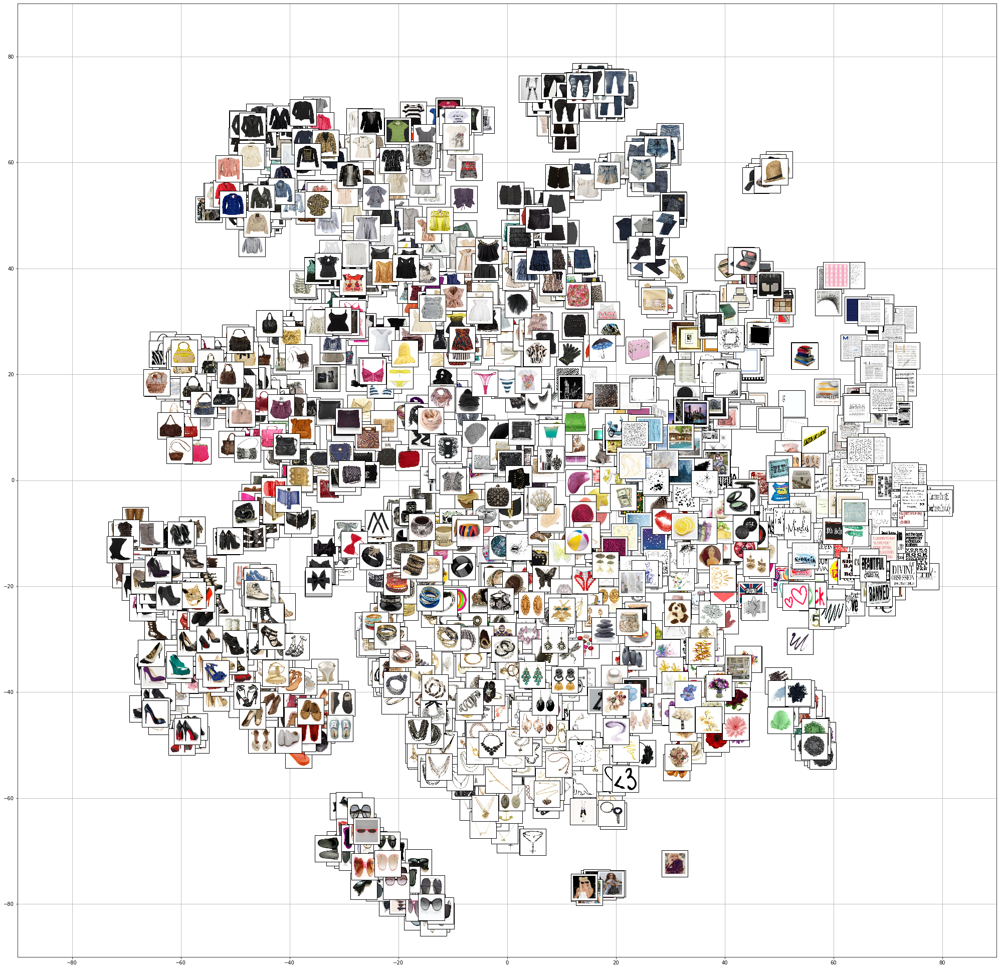

In [39]:
# Plot the clusters
xlim = (-90, 90)
ylim = (-90, 90)

fig, ax = plt.subplots(figsize=(35,35))
ax.set_xlim(xlim)
ax.set_ylim(ylim)
for i in range(2000):
    imagebox = OffsetImage(df['image_viz'][i], zoom=0.2)
    ab = AnnotationBbox(imagebox, (tsne_2dim[i, 0], tsne_2dim[i, 1]))
    ax.add_artist(ab)

plt.grid()
plt.draw()
plt.show()

In [40]:
fig = px.scatter(
    x=tsne_2dim[:, 0],
    y=tsne_2dim[:, 1],
    color=labels,
    template="plotly_white",
    color_continuous_scale=px.colors.sequential.Rainbow,
    width=1500, height=1300
    #text=words
)

fig.update_traces(textposition="top center")
fig.show()

In [41]:
bad_labels = [-1, 6, 25, 1, 48, 37, 56, 59, 13, 18, 9, 12, 41]
bad_count = 0
bad_indices = []
for i in range(len(labels)):
    if labels[i] in bad_labels:
        bad_count += 1
        bad_indices.append(i)
        
print(round(bad_count/len(labels) * 100, 2), "% of data will be deleted")

23.15 % of data will be deleted


In [42]:
df = df.drop(bad_indices)
df = df.reset_index().drop(columns=['index'])
image_viz = df['image_viz']

## Third TSNE

In [44]:
%%time
# TSNE
tsne = TSNE(n_components=2, verbose=True, n_jobs=-1)
tsne_result = tsne.fit_transform(list(df['image_feature']))

C:\Users\Роман\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

C:\Users\Роман\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 14545 samples in 0.036s...
[t-SNE] Computed neighbors for 14545 samples in 37.234s...
[t-SNE] Computed conditional probabilities for sample 1000 / 14545
[t-SNE] Computed conditional probabilities for sample 2000 / 14545
[t-SNE] Computed conditional probabilities for sample 3000 / 14545
[t-SNE] Computed conditional probabilities for sample 4000 / 14545
[t-SNE] Computed conditional probabilities for sample 5000 / 14545
[t-SNE] Computed conditional probabilities for sample 6000 / 14545
[t-SNE] Computed conditional probabilities for sample 7000 / 14545
[t-SNE] Computed conditional probabilities for sample 8000 / 14545
[t-SNE] Computed conditional probabilities for sample 9000 / 14545
[t-SNE] Computed conditional probabilities for sample 10000 / 14545
[t-SNE] Computed conditional probabilities for sample 11000 / 14545
[t-SNE] Computed conditional probabilities for sample 12000 / 14545
[t-SNE] Computed conditional probabilities for sa

In [45]:
df['tsne_0'] = tsne_result[:,0]
df['tsne_1'] = tsne_result[:,1]
tsne_0, tsne_1 = np.array(df['tsne_0']), np.array(df['tsne_1'])
tsne_2dim = np.array([val for val in zip(tsne_0, tsne_1)])

In [59]:
dbscan = DBSCAN(eps=2.0, min_samples=11).fit(tsne_2dim) # fitting the model
labels = dbscan.labels_ # getting the labels
len(np.unique(labels))

86

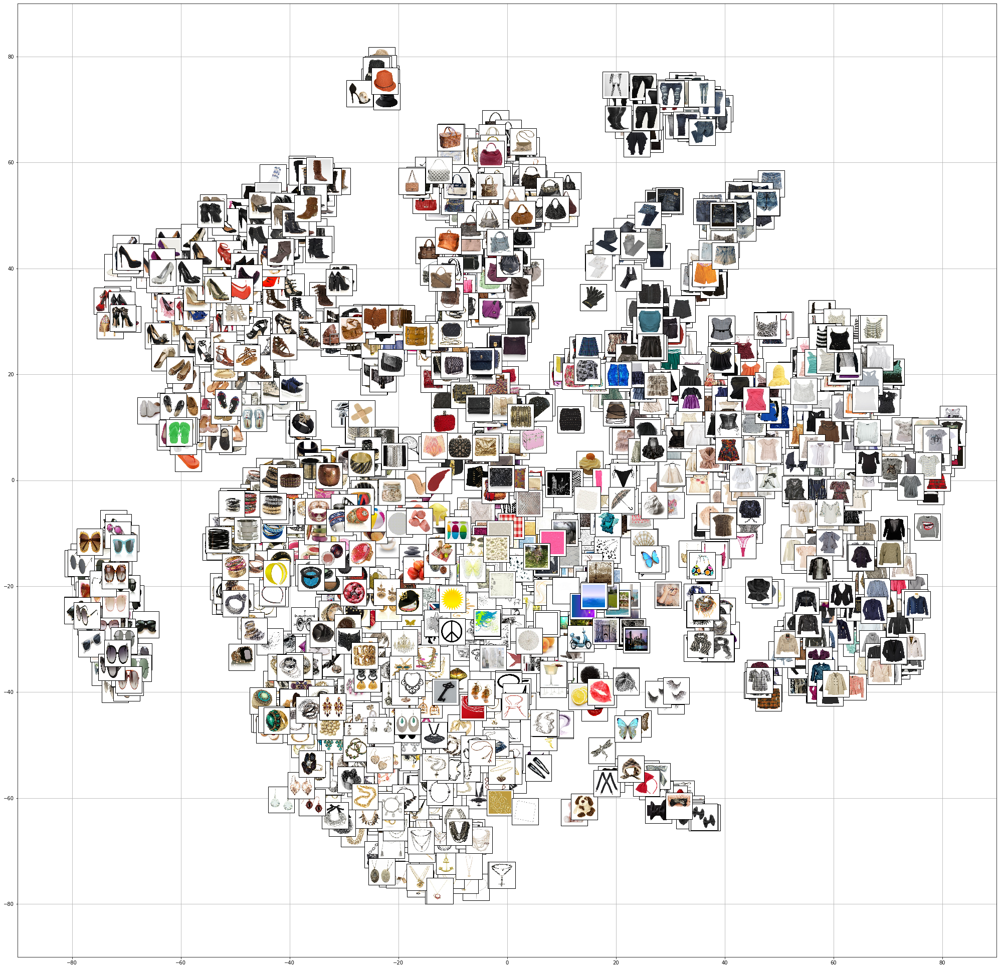

In [47]:
# Plot the clusters
xlim = (-90, 90)
ylim = (-90, 90)

fig, ax = plt.subplots(figsize=(35,35))
ax.set_xlim(xlim)
ax.set_ylim(ylim)
for i in range(2000):
    imagebox = OffsetImage(df['image_viz'][i], zoom=0.2)
    ab = AnnotationBbox(imagebox, (tsne_2dim[i, 0], tsne_2dim[i, 1]))
    ax.add_artist(ab)

plt.grid()
plt.draw()
plt.show()

In [60]:
fig = px.scatter(
    x=tsne_2dim[:, 0],
    y=tsne_2dim[:, 1],
    color=labels,
    template="plotly_white",
    color_continuous_scale=px.colors.sequential.Rainbow,
    width=1500, height=1300
    #text=words
)

fig.update_traces(textposition="top center")
fig.show()

In [49]:
bad_labels = [3, 75, 76, 61, 77, 42, 46, 26, 54, 29, 24, 14, 55, 79, 49, 35, 64, 18, 62, 40, 62, 64, 70, 54, 29]
bad_count = 0
bad_indices = []
for i in range(len(labels)):
    if labels[i] in bad_labels:
        bad_count += 1
        bad_indices.append(i)
        
print(round(bad_count/len(labels) * 100, 2), "% of data will be deleted")

14.3 % of data will be deleted


In [50]:
df = df.drop(bad_indices)
df = df.reset_index().drop(columns=['index'])
image_viz = df['image_viz']

## Fourth T-SNE

In [56]:
%%time
# TSNE
tsne = TSNE(n_components=2, verbose=True, n_jobs=-1)
tsne_result = tsne.fit_transform(list(df['image_feature']))

C:\Users\Роман\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

C:\Users\Роман\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 12465 samples in 0.030s...
[t-SNE] Computed neighbors for 12465 samples in 32.347s...
[t-SNE] Computed conditional probabilities for sample 1000 / 12465
[t-SNE] Computed conditional probabilities for sample 2000 / 12465
[t-SNE] Computed conditional probabilities for sample 3000 / 12465
[t-SNE] Computed conditional probabilities for sample 4000 / 12465
[t-SNE] Computed conditional probabilities for sample 5000 / 12465
[t-SNE] Computed conditional probabilities for sample 6000 / 12465
[t-SNE] Computed conditional probabilities for sample 7000 / 12465
[t-SNE] Computed conditional probabilities for sample 8000 / 12465
[t-SNE] Computed conditional probabilities for sample 9000 / 12465
[t-SNE] Computed conditional probabilities for sample 10000 / 12465
[t-SNE] Computed conditional probabilities for sample 11000 / 12465
[t-SNE] Computed conditional probabilities for sample 12000 / 12465
[t-SNE] Computed conditional probabilities for sa

In [61]:
df['tsne_0'] = tsne_result[:,0]
df['tsne_1'] = tsne_result[:,1]
tsne_0, tsne_1 = np.array(df['tsne_0']), np.array(df['tsne_1'])
tsne_2dim = np.array([val for val in zip(tsne_0, tsne_1)])

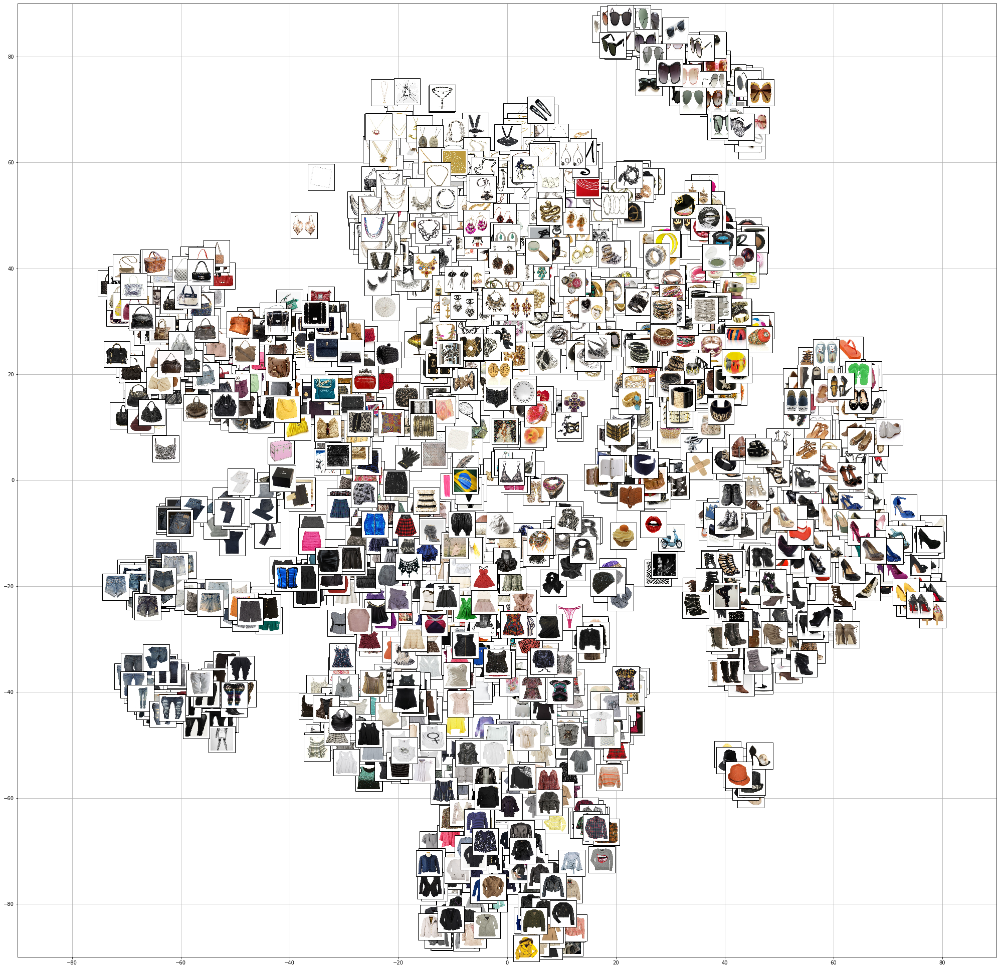

In [62]:
# Plot the clusters
xlim = (-90, 90)
ylim = (-90, 90)

fig, ax = plt.subplots(figsize=(35,35))
ax.set_xlim(xlim)
ax.set_ylim(ylim)
for i in range(2000):
    imagebox = OffsetImage(df['image_viz'][i], zoom=0.2)
    ab = AnnotationBbox(imagebox, (tsne_2dim[i, 0], tsne_2dim[i, 1]))
    ax.add_artist(ab)

plt.grid()
plt.draw()
plt.show()

In [75]:
dbscan = DBSCAN(eps=1.8, min_samples=6).fit(tsne_2dim) # fitting the model
labels = dbscan.labels_ # getting the labels
print(len(np.unique(labels)))

fig = px.scatter(
    x=tsne_2dim[:, 0],
    y=tsne_2dim[:, 1],
    color=labels,
    template="plotly_white",
    color_continuous_scale=px.colors.sequential.Rainbow,
    width=1500, height=1300
    #text=words
)

fig.update_traces(textposition="top center")
fig.show()

88


As a result, almost only relevant items stayed in dataset.

In [76]:
# save dataset without useless items
df.drop(columns=['image_viz']).to_feather('dataset_2_0.feather')

In [79]:
# save items visualization numpy array
np.save('image_viz.npy', image_viz)

In [77]:
df

,image_id,look_id,image_feature,image_viz,tsne_0,tsne_1
0,0,0,"[0.14402035, 0.0, 0.06851762, 0.019945193, 0.0...","[[[255, 255, 255], [255, 255, 255], [255, 255,...",-9.276743,-39.226650
1,4,0,"[0.0, 0.88556725, 0.19156538, 0.0, 0.015560213...","[[[255, 255, 255], [255, 255, 255], [255, 255,...",60.068588,-4.728771
2,5,0,"[0.0, 0.0, 0.5255391, 0.023882672, 0.027020002...","[[[255, 255, 255], [255, 255, 255], [255, 255,...",-26.301043,26.623367
3,6,0,"[0.08603569, 0.06738109, 0.042635284, 0.0, 0.0...","[[[255, 255, 255], [255, 255, 255], [255, 255,...",31.248148,19.657444
4,7,0,"[0.0, 0.7953321, 0.39364594, 0.0, 0.009705626,...","[[[255, 255, 255], [255, 255, 255], [255, 255,...",42.144360,39.409893
...,...,...,...,...,...,...
12460,26027,2058,"[0.04144365, 0.3307748, 0.0, 0.04235907, 0.032...","[[[255, 255, 255], [255, 255, 255], [255, 255,...",8.946985,58.889259
12461,26030,2059,"[0.8599309, 0.0, 0.07701803, 0.0018922747, 0.0...","[[[237, 236, 231], [237, 236, 231], [237, 236,...",-5.890331,-34.954437
12462,26032,2059,"[0.0, 1.0185515, 0.04129585, 0.00038612133, 0....","[[[255, 255, 255], [255, 255, 255], [255, 255,...",70.084412,-15.791395
12463,26035,2059,"[0.0, 0.06651391, 0.0, 0.07319508, 0.047552824...","[[[255, 255, 255], [255, 255, 255], [255, 255,...",-36.601360,23.826004
